In [1]:
library(dplyr)
library(stringr)
library(Seurat) # Seurat v4.1.0
library(ggplot2)
library(RColorBrewer)
library(viridis)
library(ggrepel)
library(reshape2)
library(ggbeeswarm)
library(ggpubr)
library(ggrastr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SeuratObject

Loading required package: sp

‘SeuratObject’ was built under R 4.3.1 but the current version is
4.3.2; it is recomended that you reinstall ‘SeuratObject’ as the ABI
for R may have changed

‘SeuratObject’ was built with package ‘Matrix’ 1.6.3 but the current
version is 1.6.5; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect


Loading required package: viridisLite



In [2]:
jz.save.umap.coord <- function(object) {
    # saves the UMAP embedding to the metadata 
    umapCoord <- as.data.frame(Embeddings(object = object[["umap"]]))
    object@meta.data$UMAP1 = umapCoord[,1]
    object@meta.data$UMAP2 = umapCoord[,2]
    return(object)
}

In [3]:
jz.checkgene = function(srat,gene){
    genes = rownames(srat)
    genes[startsWith(genes,gene)]
}

In [4]:
my.comparison = list(c('Alum-pSer','SMNP'),c('SMNP','Alum-pSer/SMNP'),
                     c('Alum-pSer','Alum-pSer/SMNP'))
group.col=c('Alum-pSer'='#0072B2','SMNP'='#E69F00','Alum-pSer/SMNP'='#009E73')
col=ggthemes::ggthemes_data[["tableau"]][["color-palettes"]][["regular"]]$`Classic 10`$value
col=rev(col[1:7])
cluster.col = c(col[1:3],col[5],col[4],col[7],col[6])
names(cluster.col) = paste0('C',rep(1:7))
Axis_themes <- theme(plot.title = element_text(size = 8,hjust=0.5),
                     axis.title = element_text(size = 8),
                     axis.text = element_text(size = 8,color='black'),
                     axis.text.x = element_text(size = 8,angle=45,hjust=1),                     
                     legend.text = element_text(size = 8),
                     legend.title = element_text(size = 8),
                     legend.key.size = unit(.3, 'cm'),
                     strip.text.x = element_text(size = 8),
                     strip.background = element_rect(fill=NA,linewidth=0.5,color='black'),
                     axis.line = element_line(linewidth = .3),
                     axis.ticks = element_line(linewidth = 0.3))

In [5]:
srat = readRDS('seurat_object/01_harmony_labeled.RDS')
srat

An object of class Seurat 
26779 features across 19537 samples within 2 assays 
Active assay: RNA (26769 features, 2000 variable features)
 3 layers present: data, counts, scale.data
 1 other assay present: HTO
 3 dimensional reductions calculated: pca, harmony, umap

[1] "Alum-pSer"
[1] 6480
[1] "SMNP"
[1] 3042


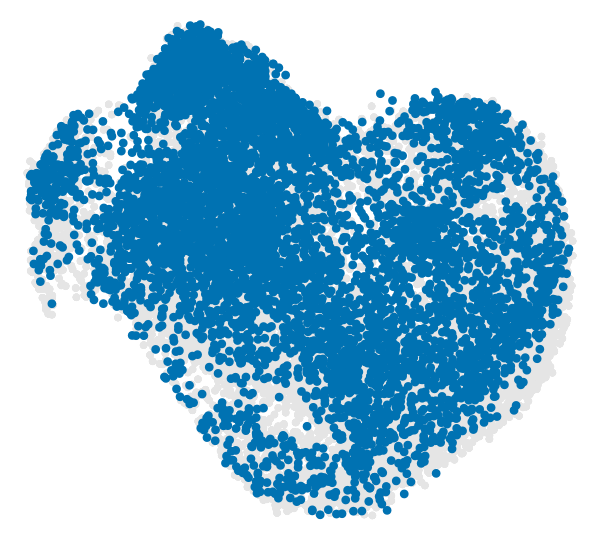

[1] "Alum-pSer/SMNP"
[1] 10015


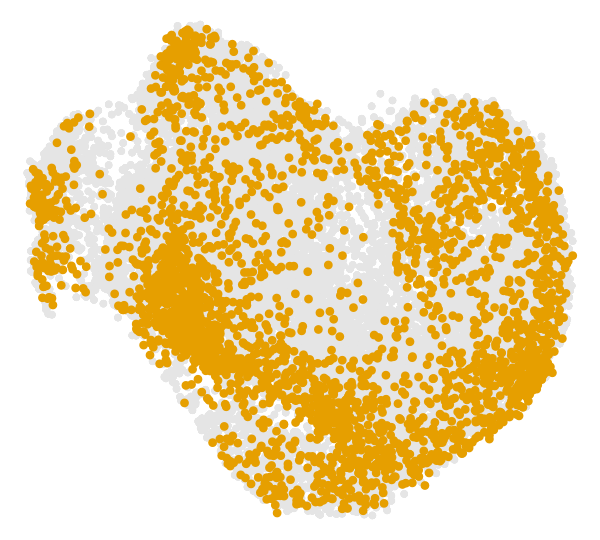

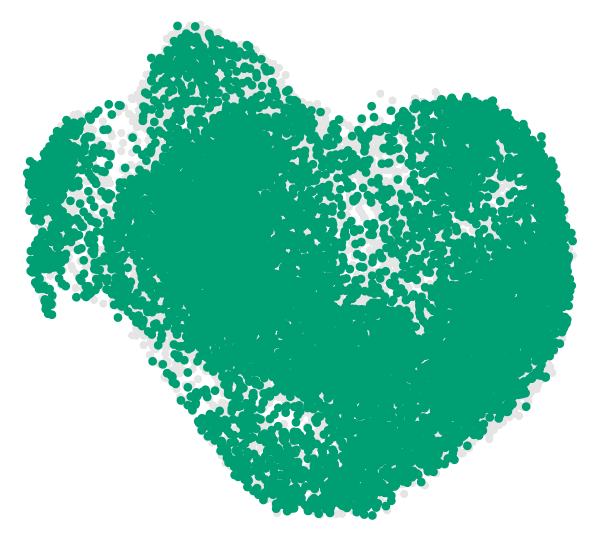

In [41]:
options(repr.plot.width=2, repr.plot.height=1.8,repr.plot.res=300)
cp=ggthemes::ggthemes_data[["tableau"]][["color-palettes"]][["regular"]]$`Classic 10`$value
cp=c('#0072B2','#E69F00','#009E73')
metadata = srat@meta.data
groups=c('Alum-pSer','SMNP','Alum-pSer/SMNP')

#cp=c(cp[1],cp[3:4])
for (i in seq(3)) {
    curr.group = groups[i]
    print(curr.group)
    metadata2 = metadata%>%filter(group==curr.group)
    print(nrow(metadata2))
    p=metadata %>% 
    ggplot(aes(x=UMAP1,y=UMAP2))+ theme_void()+NoLegend()+
    geom_point_rast(color='grey90',size=0.1,raster.dpi = 600)+
    geom_point_rast(data=metadata2,aes(x=UMAP1,y=UMAP2),color=cp[i],size=0.1,raster.dpi = 600) +
    #labs(title=sprintf('%s (n=%d)',group,nrow(metadata2)))+ 
    theme(plot.title=element_text(hjust=0.5,size=20)) 
    show(p)
}


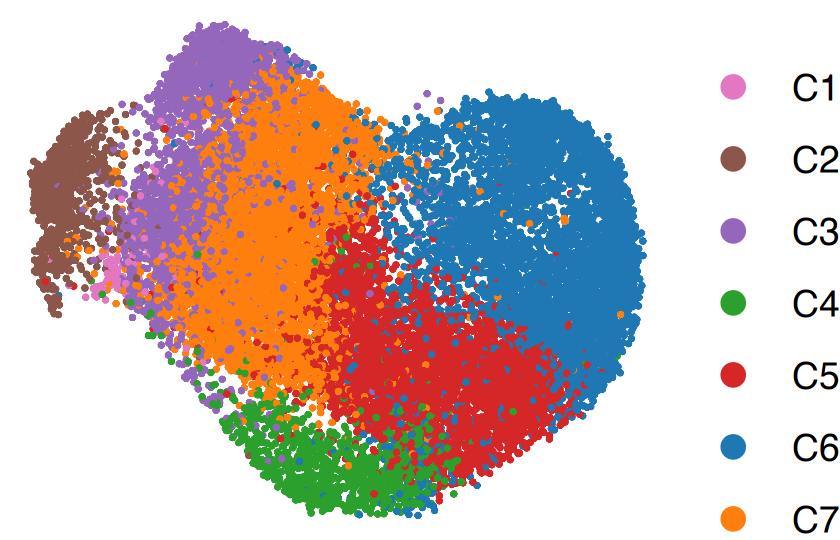

In [10]:
options(repr.plot.width=2.8, repr.plot.height=1.8,repr.plot.res=300)

metadata = srat@meta.data
metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=phenocluster))+ theme_void()+ 
geom_point_rast(size=0.05,raster.dpi = 1000)+ 
scale_colour_manual(values=cluster.col) + #labels= lab,
labs(color='')+
guides(color = guide_legend(override.aes = list(size=2)))

out = 'figures/fig2/umap_cluster.pdf'
ggsave(out,device='pdf', width = 2.8, height = 1.8,
       dpi = 300,useDingbats = FALSE)

In [16]:
table(srat$group)


     Alum-pSer           SMNP Alum-pSer/SMNP 
          6480           3042          10015 

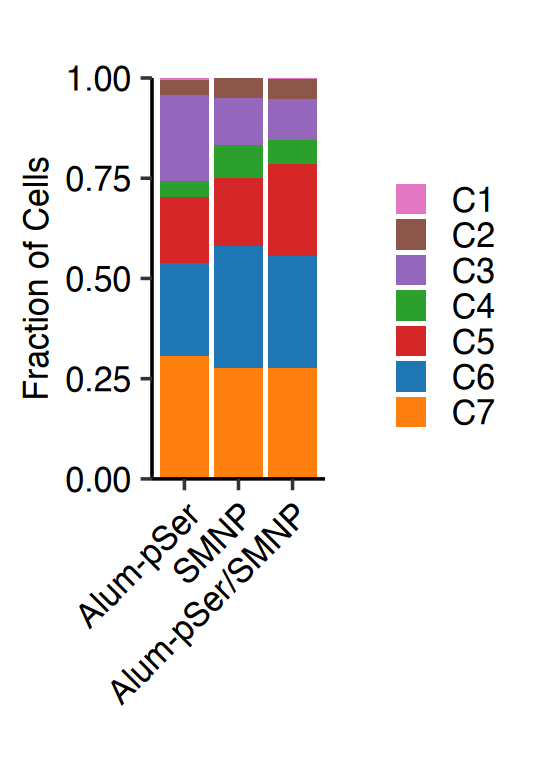

In [58]:
options(repr.plot.height=2.6, repr.plot.width=1.8,repr.plot.res=300)
metadata = srat@meta.data

metadata %>% 
ggplot(aes(x=group,fill=phenocluster)) +
geom_bar(position='fill')+theme_classic()+
scale_fill_manual(values=cluster.col) + #labels= lab,
labs(x='',y='Fraction of Cells',title='',fill='')+
scale_y_continuous(expand=c(0,0)) +
Axis_themes

out = 'figures/fig2/barplot_cluster.pdf'
ggsave(out,device='pdf', height = 2.6, width = 1.8,
       dpi = 300,useDingbats = FALSE)

In [11]:
metadata = srat@meta.data

cluster.count = metadata %>% group_by(group, phenocluster) %>% summarize(clus.count=n()) %>% 
tidyr::complete(phenocluster) %>% replace(is.na(.),0)
cluster.count = cluster.count %>% rename('cluster'= 'phenocluster')

`summarise()` has grouped output by 'group'. You can override using the
`.groups` argument.


In [12]:
df = dcast(cluster.count[cluster.count$group!='Alum-pSer',],cluster~group) 
rownames(df) = df$cluster
df = df %>% select(-cluster)
#fisher.test(df,simulate.p.value = TRUE, B = 9000000) #simulate.p.value = FALSE, B = 2000
chisq.test(as.matrix(df))

Using clus.count as value column: use value.var to override.




	Pearson's Chi-squared test

data:  as.matrix(df)
X-squared = 66.607, df = 6, p-value = 2.026e-12


In [14]:
df = dcast(cluster.count[cluster.count$group!='Alum-pSer+SMNP',],cluster~group) 
rownames(df) = df$cluster
df = df %>% select(-cluster)
#fisher.test(df,workspace = 20000000)
chisq.test(as.matrix(df))

Using clus.count as value column: use value.var to override.




	Pearson's Chi-squared test

data:  as.matrix(df)
X-squared = 609.69, df = 12, p-value < 2.2e-16


In [15]:
df = dcast(cluster.count[cluster.count$group!='SMNP',],cluster~group) 
rownames(df) = df$cluster
df = df %>% select(-cluster)
#fisher.test(df,workspace = 20000000)
chisq.test(as.matrix(df))

Using clus.count as value column: use value.var to override.




	Pearson's Chi-squared test

data:  as.matrix(df)
X-squared = 501.56, df = 6, p-value < 2.2e-16


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


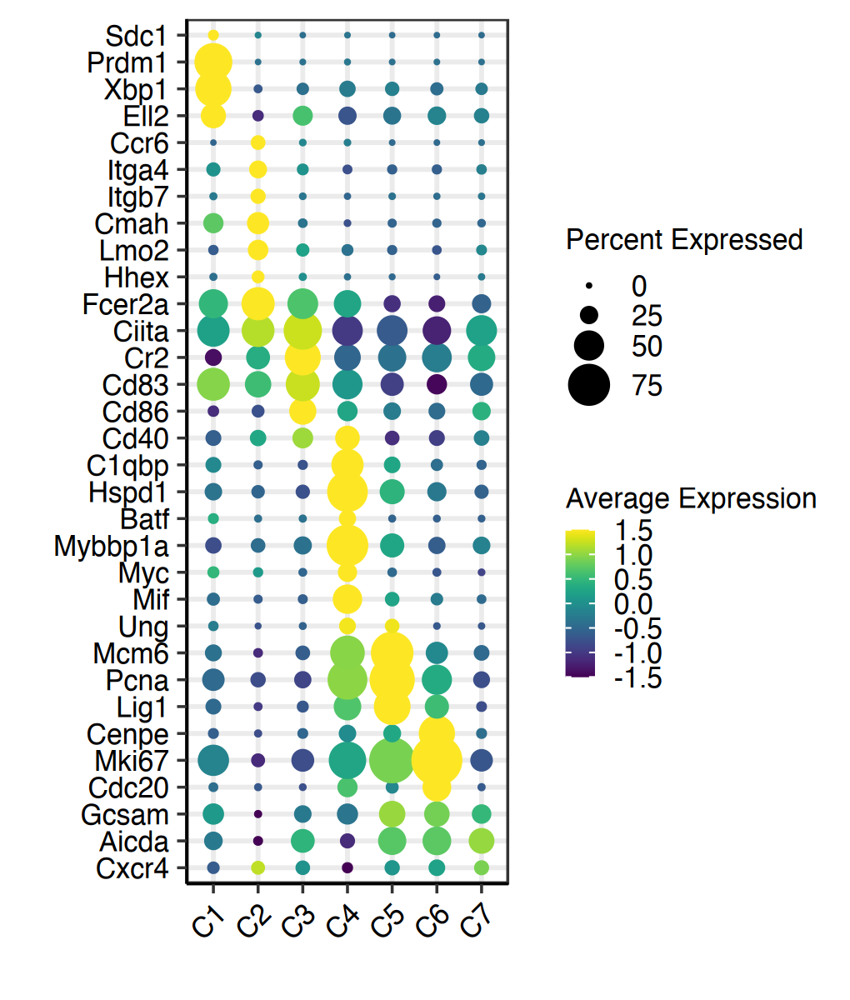

In [17]:
options(repr.plot.height=4, repr.plot.width=3.4,repr.plot.res=300)

genelist = c('Sdc1','Prdm1','Xbp1','Ell2',
             'Ccr6','Itga4','Itgb7','Cmah','Lmo2','Hhex','Fcer2a',
             'Ciita','Cr2','Cd83','Cd86',#'H2-DMa','H2-Ab1',
             'Cd40',
             'C1qbp','Hspd1','Batf','Mybbp1a','Myc','Mif',#'Mtor','Bcl2a1b',
             'Ung','Mcm6','Pcna','Lig1',
             'Cenpe','Mki67','Cdc20',
             'Gcsam','Aicda','Cxcr4'#'Ltb','Syk','Cd79b','Foxo1' 
            )
DotPlot(srat,features = rev(genelist),group.by = 'phenocluster',col.max = 1.5,col.min=-1.5) + 
scale_color_viridis() + labs(x='',y='') + 
coord_flip()+ theme_bw()+
Axis_themes 
# theme(text = element_text(color='black',size=8),
#       #axis.text.x=element_text(angle=60, hjust=1,vjust=1),
#       plot.title=element_text(hjust=0.5,size=8,face='bold'))  

out = 'figures/fig2/dotplot_vertical.pdf'
ggsave(out,device='pdf', height = 4, width = 3.4,
       dpi = 300,useDingbats = FALSE)


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


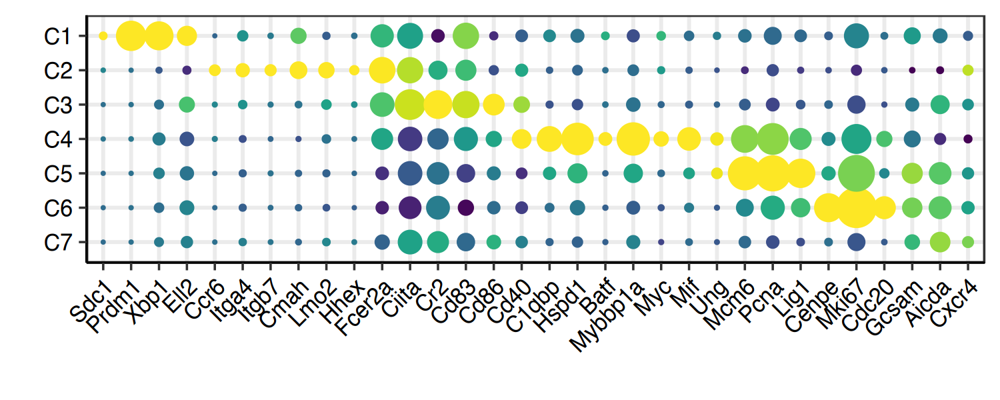

In [54]:
options(repr.plot.height=2, repr.plot.width=5,repr.plot.res=300)

genelist = c('Sdc1','Prdm1','Xbp1','Ell2',
             'Ccr6','Itga4','Itgb7','Cmah','Lmo2','Hhex','Fcer2a',
             'Ciita','Cr2','Cd83','Cd86',#'H2-DMa','H2-Ab1',
             'Cd40',
             'C1qbp','Hspd1','Batf','Mybbp1a','Myc','Mif',#'Mtor','Bcl2a1b',
             'Ung','Mcm6','Pcna','Lig1',
             'Cenpe','Mki67','Cdc20',
             'Gcsam','Aicda','Cxcr4'#'Ltb','Syk','Cd79b','Foxo1' 
            )
test = srat
#test$phenocluster = factor(test$phenocluster, levels=paste0('C',seq(1:7)))
Idents(test) = 'phenocluster'
test@active.ident = factor(test@active.ident, levels=rev(paste0('C',seq(1:7))))
DotPlot(test,features = genelist,col.max = 1.5,col.min=-1.5) + 
scale_color_viridis() + labs(x='',y='') + 
#coord_flip()+ 
theme_bw()+ NoLegend()+
Axis_themes 
# theme(text = element_text(color='black',size=8),
#       #axis.text.x=element_text(angle=60, hjust=1,vjust=1),
#       plot.title=element_text(hjust=0.5,size=8,face='bold'))  

out = 'figures/fig2/dotplot_horizontal.pdf'
ggsave(out,device='pdf', height = 2, width = 4.8,
       dpi = 300,useDingbats = FALSE)


`summarise()` has grouped output by 'group', 'mouse.id'. You can override using
the `.groups` argument.
Adding missing grouping variables: `phenocluster`
Warning message in wilcox.test.default(c(0, 0.117647058823529, 0.032258064516129, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.17312661498708, 0, 0.191677175283733, :
“cannot compute exact p-value with ties”
Dunn (1964) Kruskal-Wallis multiple comparison

  p-values adjusted with the Benjamini-Hochberg method.




                  Comparison          Z      P.unadj        P.adj
1 Alum-pSer - Alum-pSer/SMNP -3.8698770 0.0001088903 0.0003266708
2           Alum-pSer - SMNP -0.2944409 0.7684210046 0.7684210046
3      Alum-pSer/SMNP - SMNP  2.9516679 0.0031606264 0.0047409396

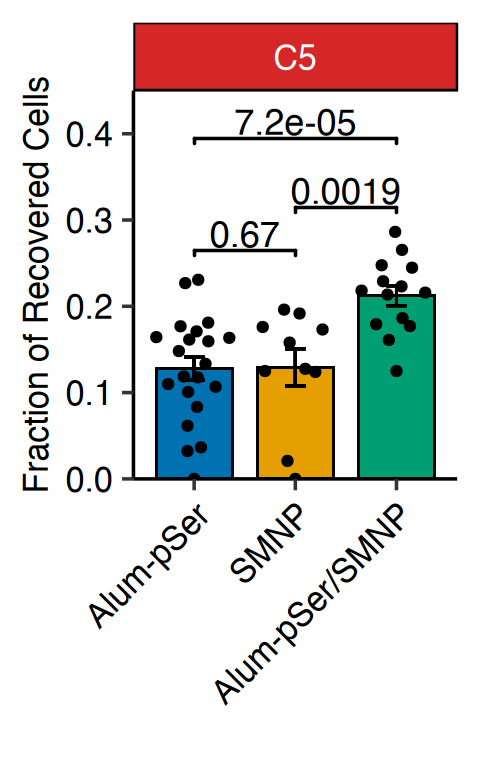

In [26]:
options(repr.plot.width=1.6,repr.plot.height=2.6,repr.plot.res=300)

metadata = srat@meta.data

df4gg = metadata %>% 
group_by(group,mouse.id,phenocluster) %>% summarize(ncell.cluster.mouse = n()) %>% ungroup()%>%
tidyr::complete(tidyr::nesting(group,mouse.id),phenocluster) %>% replace(is.na(.), 0) %>% 
group_by(group,mouse.id) %>%
mutate(ncell.mouse=sum(ncell.cluster.mouse),frac=ncell.cluster.mouse/ncell.mouse) 

df4gg = df4gg %>% filter(phenocluster=='C5',ncell.mouse>10) %>% group_by(group,phenocluster) %>% 
mutate(mean.frac = mean(frac),se = sd(frac) / sqrt(n()) ) 
df4gg2 = df4gg %>% select(group,mean.frac,se) %>% unique() 

df4gg %>% 
ggplot(aes(x=group,y=frac)) + theme_classic() + NoLegend()+

geom_bar(data = df4gg2, aes(x=group,y=mean.frac,fill=group),
         stat='identity',color='black',width=0.75,linewidth = 0.25) + 
geom_quasirandom(size=0.5,color='black') +
geom_errorbar(aes(ymin=mean.frac-se,ymax=mean.frac+se), width = 0.2,linewidth = 0.25) + 
facet_wrap('phenocluster') +
labs(x='',y='Fraction of Recovered Cells')+ 
scale_fill_manual(values=group.col) +
scale_y_continuous(limits=c(-0,0.45),expand =c(0,0)) +
stat_compare_means(method='wilcox.test',tip.length = 0.02, 
                   comparisons = my.comparison,size=3,label.y = c(0.25,0.30,0.38))+ 
#stat_compare_means(method='kruskal.test',tip.length = 0.02,size=3,label.y = 0.7)+ 
Axis_themes +
theme(strip.text=element_text(size=14,color='white',face='bold'),
      strip.background = element_rect(fill = "#d62728", linewidth = 0.3))

#TukeyHSD(aov(frac ~ group,data=df4gg %>% filter(phenocluster%in%c('C5'))))
FSA::dunnTest(frac ~ group,
         data=df4gg %>% filter(phenocluster%in%c('C5')),
         method="bh")

# out = 'figures/fig2/S_phase_by_mouse.pdf'
# ggsave(out,device='pdf', height = 2.6, width = 1.6,
#        dpi = 300,useDingbats = FALSE)


`summarise()` has grouped output by 'group', 'mouse.id'. You can override using
the `.groups` argument.
Adding missing grouping variables: `phenocluster`
Warning message in wilcox.test.default(c(0, 0.117647058823529, 0.032258064516129, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.17312661498708, 0, 0.191677175283733, :
“cannot compute exact p-value with ties”
Dunn (1964) Kruskal-Wallis multiple comparison

  p-values adjusted with the Benjamini-Hochberg method.




                  Comparison          Z      P.unadj        P.adj
1 Alum-pSer - Alum-pSer/SMNP -3.8698770 0.0001088903 0.0003266708
2           Alum-pSer - SMNP -0.2944409 0.7684210046 0.7684210046
3      Alum-pSer/SMNP - SMNP  2.9516679 0.0031606264 0.0047409396

Warning message in wilcox.test.default(c(0, 0.117647058823529, 0.032258064516129, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.17312661498708, 0, 0.191677175283733, :
“cannot compute exact p-value with ties”


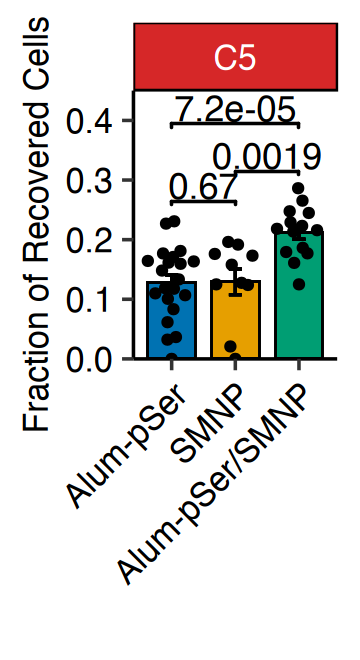

In [9]:
options(repr.plot.width=1.2,repr.plot.height=2.2,repr.plot.res=300)

metadata = srat@meta.data

df4gg = metadata %>% 
group_by(group,mouse.id,phenocluster) %>% summarize(ncell.cluster.mouse = n()) %>% ungroup()%>%
tidyr::complete(tidyr::nesting(group,mouse.id),phenocluster) %>% replace(is.na(.), 0) %>% 
group_by(group,mouse.id) %>%
mutate(ncell.mouse=sum(ncell.cluster.mouse),frac=ncell.cluster.mouse/ncell.mouse) 

df4gg = df4gg %>% filter(phenocluster=='C5',ncell.mouse>10) %>% group_by(group,phenocluster) %>% 
mutate(mean.frac = mean(frac),se = sd(frac) / sqrt(n()) ) 
df4gg2 = df4gg %>% select(group,mean.frac,se) %>% unique() 

df4gg %>% 
ggplot(aes(x=group,y=frac)) + theme_classic() + NoLegend()+

geom_bar(data = df4gg2, aes(x=group,y=mean.frac,fill=group),
         stat='identity',color='black',width=0.75,linewidth = 0.25) + 
geom_quasirandom(size=0.5,color='black') +
geom_errorbar(aes(ymin=mean.frac-se,ymax=mean.frac+se), width = 0.2,linewidth = 0.25) + 
facet_wrap('phenocluster') +
labs(x='',y='Fraction of Recovered Cells')+ 
scale_fill_manual(values=group.col) +
scale_y_continuous(limits=c(-0,0.45),expand =c(0,0)) +
stat_compare_means(method='wilcox.test',tip.length = 0.02, 
                   comparisons = my.comparison,size=3,label.y = c(0.25,0.30,0.38))+ 
#stat_compare_means(method='kruskal.test',tip.length = 0.02,size=3,label.y = 0.7)+ 
Axis_themes +
theme(strip.text=element_text(size=14,color='white',face='bold'),
      strip.background = element_rect(fill = "#d62728", linewidth = 0.3))

#TukeyHSD(aov(frac ~ group,data=df4gg %>% filter(phenocluster%in%c('C5'))))
FSA::dunnTest(frac ~ group,
         data=df4gg %>% filter(phenocluster%in%c('C5')),
         method="bh")

out = 'figures/fig2/S_phase_by_mouse2.pdf'
ggsave(out,device='pdf', height = 2.2, width = 1.2,
       dpi = 300,useDingbats = FALSE)


`summarise()` has grouped output by 'group', 'mouse.id'. You can override using
the `.groups` argument.
Adding missing grouping variables: `phenocluster`
Warning message in wilcox.test.default(c(0, 0, 0.032258064516129, 0, 0, 0.0121951219512195, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0.032258064516129, 0, 0, 0.0121951219512195, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0.00147492625368732, 0, 0.00168067226890756, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0909090909090909, 0.411764705882353, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0909090909090909, 0.411764705882353, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.454545454545455, 0.117647058823529, 0.161290322580645, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.13695

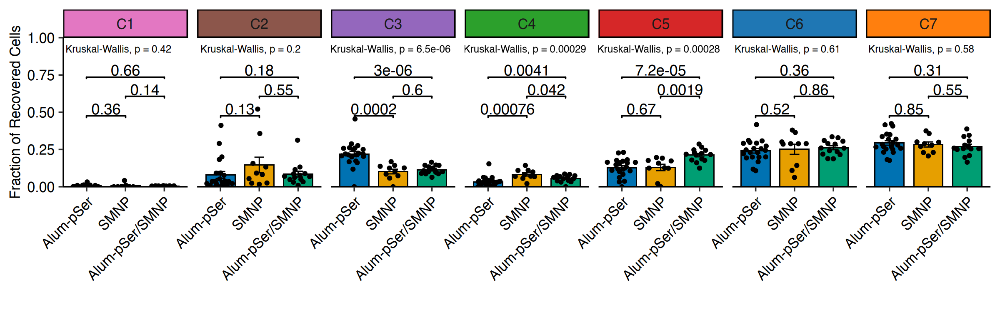

In [38]:
options(repr.plot.width=8,repr.plot.height=2.5,repr.plot.res=300)

metadata = srat@meta.data

# calculate fraction 
df4gg = metadata %>% 
group_by(group,mouse.id,phenocluster) %>% summarize(ncell.cluster.mouse = n()) %>% ungroup()%>%
tidyr::complete(tidyr::nesting(group,mouse.id),phenocluster) %>% replace(is.na(.), 0) %>% 
group_by(group,mouse.id) %>%
mutate(ncell.mouse=sum(ncell.cluster.mouse),frac=ncell.cluster.mouse/ncell.mouse) 

# calculate barplot
df4gg = df4gg %>% filter(ncell.mouse>10) %>% 
group_by(group,phenocluster) %>% 
mutate(mean.frac = mean(frac),se = sd(frac) / sqrt(n()) ) 
df4gg2 = df4gg %>% select(group,mean.frac,se) %>% unique() 

# setup plotting
strip = ggh4x::strip_themed(background_x = ggh4x::elem_list_rect(fill = cluster.col))
df4gg %>% 
ggplot(aes(x=group,y=frac)) + theme_classic() + NoLegend()+
scale_y_continuous(limits=c(0,1),expand =c(0,0)) +
geom_bar(data = df4gg2, aes(x=group,y=mean.frac, fill=group),
         stat='identity',color='black',width=0.75,linewidth = 0.25) + 
geom_quasirandom(size=0.5) +
geom_errorbar(data = df4gg2, width = 0.25,linewidth = 0.25, 
              aes(x=group,y=mean.frac, ymin=mean.frac-se,ymax=mean.frac+se)) + 
ggh4x::facet_wrap2('phenocluster',strip = strip,ncol=7) +
labs(x='',y='Fraction of Recovered Cells')+ 
scale_fill_manual(values=group.col) +
stat_compare_means(method='kruskal.test',tip.length = 0.02,size=2,label.y = 0.9)+ 
stat_compare_means(method='wilcox',tip.length = 0.02,size=3,
                   label.y=c(0.45,0.58,0.71),comparisons = my.comparison)+ 
Axis_themes


`summarise()` has grouped output by 'group', 'mouse.id'. You can override using
the `.groups` argument.
Adding missing grouping variables: `phenocluster`
Warning message in wilcox.test.default(c(0, 0, 0.032258064516129, 0, 0, 0.0121951219512195, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0.032258064516129, 0, 0, 0.0121951219512195, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0.00147492625368732, 0, 0.00168067226890756, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0909090909090909, 0.411764705882353, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.0909090909090909, 0.411764705882353, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.454545454545455, 0.117647058823529, 0.161290322580645, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.13695

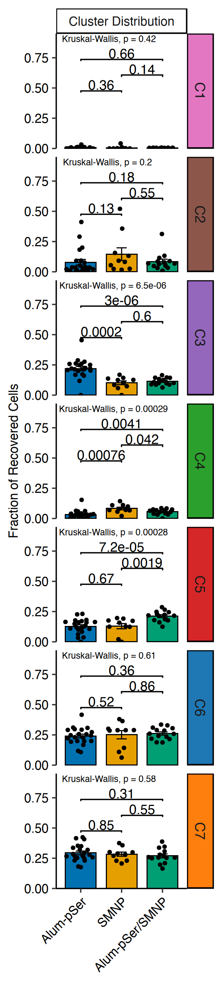

In [37]:
options(repr.plot.width=2,repr.plot.height=9,repr.plot.res=300)

metadata = srat@meta.data

# calculate fraction 
df4gg = metadata %>% 
group_by(group,mouse.id,phenocluster) %>% summarize(ncell.cluster.mouse = n()) %>% ungroup()%>%
tidyr::complete(tidyr::nesting(group,mouse.id),phenocluster) %>% replace(is.na(.), 0) %>% 
group_by(group,mouse.id) %>%
mutate(ncell.mouse=sum(ncell.cluster.mouse),frac=ncell.cluster.mouse/ncell.mouse) 

# calculate barplot
df4gg = df4gg %>% filter(ncell.mouse>10) %>% 
group_by(group,phenocluster) %>% 
mutate(mean.frac = mean(frac),se = sd(frac) / sqrt(n()) ) 
df4gg$title = factor('Cluster Distribution')
df4gg2 = df4gg %>% select(group,mean.frac,se,title) %>% unique() 

# setup plotting
strip = ggh4x::strip_themed(background_x = ggh4x::elem_list_rect(fill = NA),
                            background_y = ggh4x::elem_list_rect(fill = cluster.col))
df4gg %>% 
ggplot(aes(x=group,y=frac)) + theme_classic() + NoLegend()+
scale_y_continuous(limits=c(0,0.95),expand =c(0,0)) +
geom_bar(data = df4gg2, aes(x=group,y=mean.frac, fill=group),
         stat='identity',color='black',width=0.75,linewidth = 0.25) + 
geom_quasirandom(size=0.5) +
geom_errorbar(data = df4gg2, width = 0.25,linewidth = 0.25, 
              aes(x=group,y=mean.frac, ymin=mean.frac-se,ymax=mean.frac+se)) + 
ggh4x::facet_grid2(phenocluster ~ title, strip = strip) +
labs(x='',y='Fraction of Recovered Cells')+ 
scale_fill_manual(values=group.col) +
stat_compare_means(method='kruskal.test',tip.length = 0.02,size=2,label.y = 0.88)+ 
stat_compare_means(method='wilcox',tip.length = 0.02,size=3,
                   label.y=c(0.45,0.58,0.71),comparisons = my.comparison)+ 
Axis_themes


`summarise()` has grouped output by 'group', 'mouse.id'. You can override using
the `.groups` argument.
Warning message in wilcox.test.default(c(1, 3.5, 3, 3, 2.55555555555556, 2.69655172413793, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1, 3.5, 3, 3, 2.55555555555556, 2.69655172413793, :
“cannot compute exact p-value with ties”
Warning message:
“Some rows deleted from 'x' and 'g' because missing data.”
Dunn (1964) Kruskal-Wallis multiple comparison

  p-values adjusted with the Benjamini-Hochberg method.




                  Comparison          Z      P.unadj        P.adj
1 Alum-pSer - Alum-pSer/SMNP -4.8452289 1.264658e-06 3.793973e-06
2           Alum-pSer - SMNP -3.7677782 1.647070e-04 2.470605e-04
3      Alum-pSer/SMNP - SMNP  0.4120862 6.802763e-01 6.802763e-01

Warning message in wilcox.test.default(c(1, 3.5, 3, 3, 2.55555555555556, 2.69655172413793, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1, 3.5, 3, 3, 2.55555555555556, 2.69655172413793, :
“cannot compute exact p-value with ties”


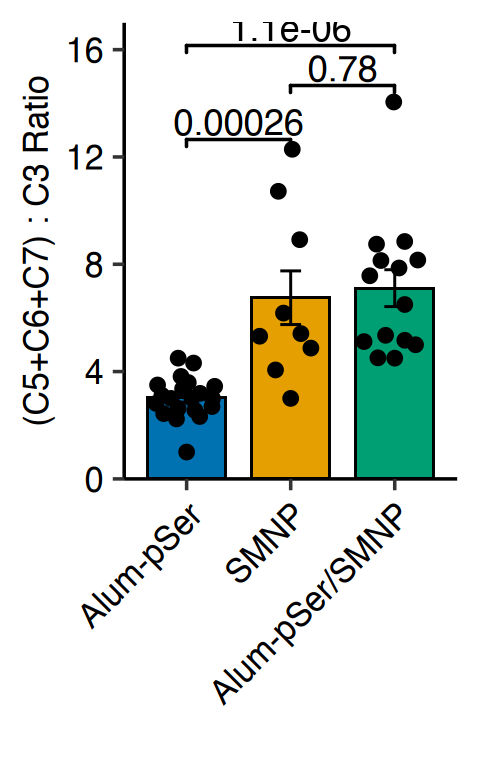

In [20]:
options(repr.plot.width=1.6,repr.plot.height=2.6,repr.plot.res=300)

metadata = srat@meta.data

df4gg = metadata %>% 
# label DZ, LZ, remove other cells 
mutate(phenocluster = ifelse(phenocluster %in% c('C5','C6','C7'), 'DZ', 
                         ifelse(phenocluster %in% c('C3'), 'LZ','Other') )) %>% 
group_by(group,mouse.id,phenocluster) %>% summarize(ncell.cluster.mouse = n()) %>% ungroup()%>%
tidyr::complete(tidyr::nesting(group,mouse.id),phenocluster) %>% replace(is.na(.), 0) %>% 
group_by(group,mouse.id) %>%
mutate(ncell.mouse=sum(ncell.cluster.mouse),frac=ncell.cluster.mouse/ncell.mouse) %>% 
filter(ncell.mouse>10,phenocluster !='Other')

df4gg = df4gg %>% select(group, mouse.id, phenocluster, frac) %>% 
tidyr::pivot_wider(names_from = phenocluster, values_from = frac) %>% 
mutate(ratio1 = DZ/LZ, ratio2=LZ/DZ) 

df4gg$ratio1[is.infinite(df4gg$ratio1)] <- NA
df4gg$ratio2[is.infinite(df4gg$ratio2)] <- NA

df4gg2 = df4gg %>% group_by(group) %>% 
mutate(mean1 = mean(ratio1,na.rm = TRUE),std1 = sd(ratio1,na.rm = TRUE),se1 = std1 / sqrt(n()),
       mean2 = mean(ratio2,na.rm = TRUE),std2 = sd(ratio2,na.rm = TRUE),se2 = std2 / sqrt(n())) %>% 
select(group,mean1,std1,se1, mean2, std2, se2) %>% unique() 

df4gg %>% filter(!is.na(ratio1)) %>%
ggplot(aes(x=group,y=ratio1)) + theme_classic() + NoLegend()+
geom_bar(data = df4gg2, aes(x=group,y=mean1,fill=group),
         stat='identity',color='black',width=0.75,linewidth = 0.25) + 
geom_quasirandom(size=1,color='black') +
geom_errorbar(data = df4gg2, width = 0.2,linewidth = 0.25, 
              aes(x=group,y=mean1,ymin=mean1-se1,ymax=mean1+se1)) + 
#facet_wrap('phenocluster') +
labs(x='',y='(C5+C6+C7) : C3 Ratio')+ 
scale_fill_manual(values=group.col) +
scale_y_continuous(expand =c(0,0),limits = c(0,17)) +
stat_compare_means(method='wilcox.test',tip.length = 0.02, label.y = c(12,14,15.5),
                   comparisons = my.comparison,size=3) + #label.y = c(0.4,0.5,0.6))+ 
#stat_compare_means(method='kruskal.test',tip.length = 0.02,size=3,label.y = 0.7)+ 
Axis_themes +
theme(strip.text=element_text(size=14,color='white',face='bold'),
      strip.background = element_rect(fill = "#d62728", linewidth = 0.3))

#TukeyHSD(aov(frac ~ group,data=df4gg %>% filter(phenocluster%in%c('C5'))))
FSA::dunnTest(ratio1 ~ group,
         data=df4gg,
         method="bh")

out = 'figures/fig2/DZLZ_ratio_by_mouse.pdf'
ggsave(out,device='pdf', height = 2.6, width = 1.6,
       dpi = 300,useDingbats = FALSE)


Warning message in wilcox.test.default(c(1, 0.285714285714286, 0.333333333333333, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(1, 0.285714285714286, 0.333333333333333, :
“cannot compute exact p-value with ties”
Dunn (1964) Kruskal-Wallis multiple comparison

  p-values adjusted with the Benjamini-Hochberg method.




                  Comparison          Z      P.unadj        P.adj
1 Alum-pSer - Alum-pSer/SMNP  4.3245264 1.528599e-05 4.585796e-05
2           Alum-pSer - SMNP  3.6938452 2.208883e-04 3.313324e-04
3      Alum-pSer/SMNP - SMNP -0.1760287 8.602714e-01 8.602714e-01

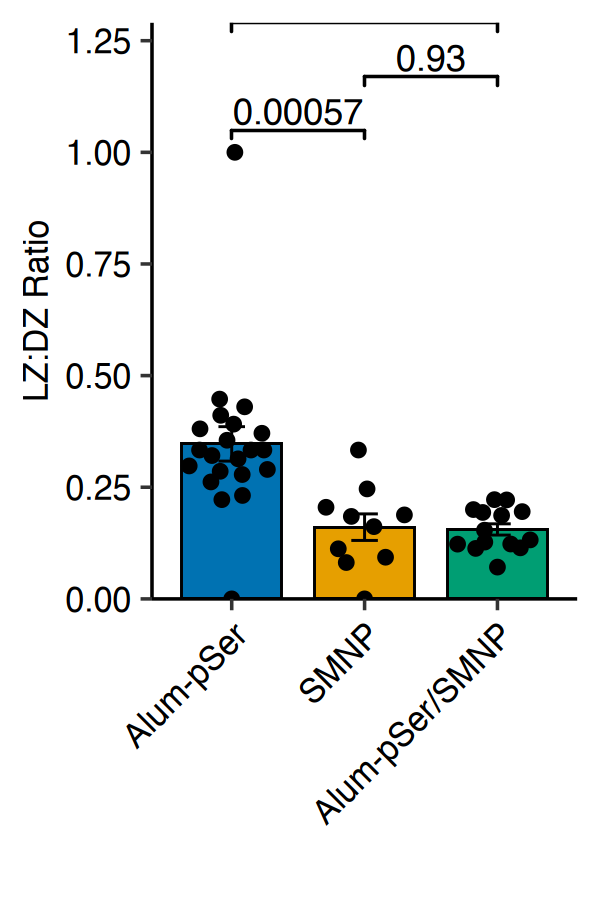

In [97]:
df4gg %>% 
ggplot(aes(x=group,y=ratio2)) + theme_classic() + NoLegend()+
geom_bar(data = df4gg2, aes(x=group,y=mean2,fill=group),
         stat='identity',color='black',width=0.75,linewidth = 0.25) + 
geom_quasirandom(size=1,color='black') +
geom_errorbar(data = df4gg2, width = 0.2,linewidth = 0.25, 
              aes(x=group,y=mean2,ymin=mean2-se2,ymax=mean2+se2)) + 
#facet_wrap('phenocluster') +
labs(x='',y='LZ:DZ Ratio')+ 
scale_fill_manual(values=group.col) +
scale_y_continuous(expand =c(0,0)) +
stat_compare_means(method='wilcox.test',tip.length = 0.02, 
                   comparisons = my.comparison,size=3) + #label.y = c(0.4,0.5,0.6))+ 
#stat_compare_means(method='kruskal.test',tip.length = 0.02,size=3,label.y = 0.7)+ 
Axis_themes +
theme(strip.text=element_text(size=14,color='white',face='bold'),
      strip.background = element_rect(fill = "#d62728", linewidth = 0.3))

#TukeyHSD(aov(frac ~ group,data=df4gg %>% filter(phenocluster%in%c('C5'))))
FSA::dunnTest(ratio2 ~ group,
         data=df4gg,
         method="bh")


`summarise()` has grouped output by 'group', 'mouse.id', 'phenocluster'. You
can override using the `.groups` argument.
Adding missing grouping variables: `gene`
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0.0400760476367104, 0.867713107347003, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0.0400760476367104, 0.867713107347003, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0.882285478394819, 0.587004434142117, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0.882285478394819, 0.587004434142117, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.631497520186982, 1.65580383299203, 0.487473858549753, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0.775485480356292, 0, 0, 1.98858234946178, :
“cannot compute exact p-value with ties”
Warnin

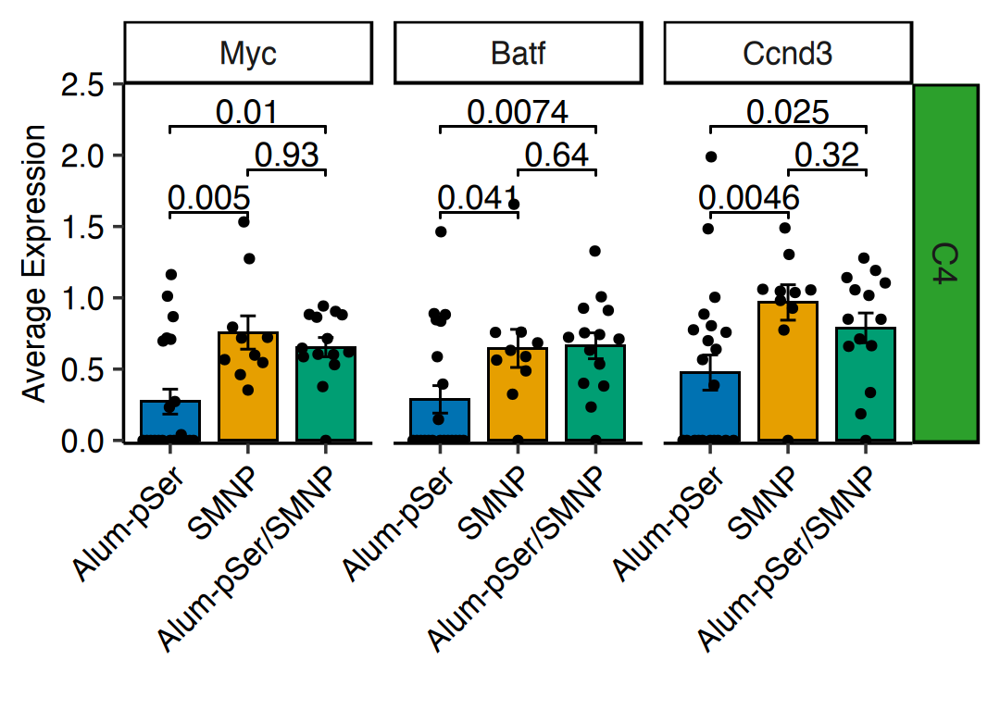

In [66]:
options(repr.plot.width=3.6,repr.plot.height=2.6,repr.plot.res=300)

df = FetchData(srat,c('Myc','Batf','Ccnd3','phenocluster','group','mouse.id')) 

df4gg = df %>% select(group,mouse.id,phenocluster,Myc,Batf,Ccnd3) %>%  ## Change
# change to long df format
melt(id.vars = c("group", "mouse.id", "phenocluster"), 
     value.name = 'expression',variable.name = 'gene') %>% 
# calculate mouse level mean expression 
group_by(group,mouse.id,phenocluster,gene) %>% 
mutate(expr = expm1(expression)) %>% 
summarize(ncell.expressed=sum(expr>0),mean.exp=mean(expr)) %>%
ungroup() %>% mutate(mean.exp = log1p(mean.exp)) %>%
tidyr::complete(tidyr::nesting(group,mouse.id),phenocluster,gene) %>% replace(is.na(.),0)

# add ncell.mouse info
ncell.mouse= df %>% count(group,mouse.id,name = 'ncell')
ncell.mouse = ncell.mouse %>% filter(mouse.id %in% df4gg$mouse.id)
df4gg$ncell.mouse = ncell.mouse$ncell[match(df4gg$mouse.id,ncell.mouse$mouse.id)]

# filter based on number of cell per mouse 
df4gg = df4gg %>% filter(phenocluster %in% c('C4'),ncell.mouse>10) 
df4gg2 = df4gg %>% group_by(group,gene) %>% 
mutate(group.mean.exp = mean(mean.exp),se = sd(mean.exp) / sqrt(n()) ) %>% 
select(group,group.mean.exp,se) %>% unique() 
strip = ggh4x::strip_themed(background_x = ggh4x::elem_list_rect(fill = NA),
                            background_y = ggh4x::elem_list_rect(fill =cluster.col[4]))
df4gg %>% 
ggplot(aes(x=group,y=mean.exp)) + theme_classic() + 
geom_bar(data = df4gg2, aes(x=group,y=group.mean.exp,fill=group),
         stat='identity',color='black',width=0.75,linewidth = 0.25) + 
geom_errorbar(data = df4gg2, width = 0.2,linewidth = 0.25,
              aes(x=group,y=group.mean.exp,ymin=group.mean.exp - se, ymax=group.mean.exp + se)) + 
geom_quasirandom(size=0.5,color='black') +
scale_fill_manual(values=group.col) +
#stat_compare_means(method='kruskal.test',tip.length = 0.02,size=3,label.y = 3.5) +
stat_compare_means(method='wilcox.test',tip.length = 0.02, comparisons = my.comparison,
                   size=3,label.y = c(1.5,1.8,2.1),bracket.size=0.25)+ 
ggh4x::facet_grid2(phenocluster ~ gene,strip = strip) +
labs(x='',y='Average Expression',size='Fraction\nExpressed') +
scale_y_continuous(expand =c(0,0),limits = c(-0.02,2.5)) +
guides(fill = 'none') +
Axis_themes +
theme() 

# out = 'figures/fig2/gex_by_mouse.pdf'
# ggsave(out,device='pdf', height = 2.6, width = 3.6,
#        dpi = 300,useDingbats = FALSE)


In [ ]:
# stats
FSA::dunnTest(mean.exp ~ group,
         data=df4gg %>% filter(phenocluster=='C4',gene == 'Myc'),
         method="bh")
FSA::dunnTest(mean.exp ~ group,
         data=df4gg %>% filter(phenocluster=='C4',gene == 'Batf'),
         method="bh")
FSA::dunnTest(mean.exp ~ group,
         data=df4gg %>% filter(phenocluster=='C4',gene == 'Ccnd3'),
         method="bh")

`summarise()` has grouped output by 'group', 'mouse.id', 'phenocluster'. You
can override using the `.groups` argument.
Adding missing grouping variables: `phenocluster`, `gene`
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0, 0.783149722254259, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0, 0.783149722254259, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0, 0, 0, 0, 0, 0, 0.327443532698316, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0.619748231281095, 0, 0, 0, 0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0, 0.619748231281095, 0, 0, 0, 0, 0, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.460519265624143, 0, 0.944211115705488, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0.922881039592554, 0.414905041

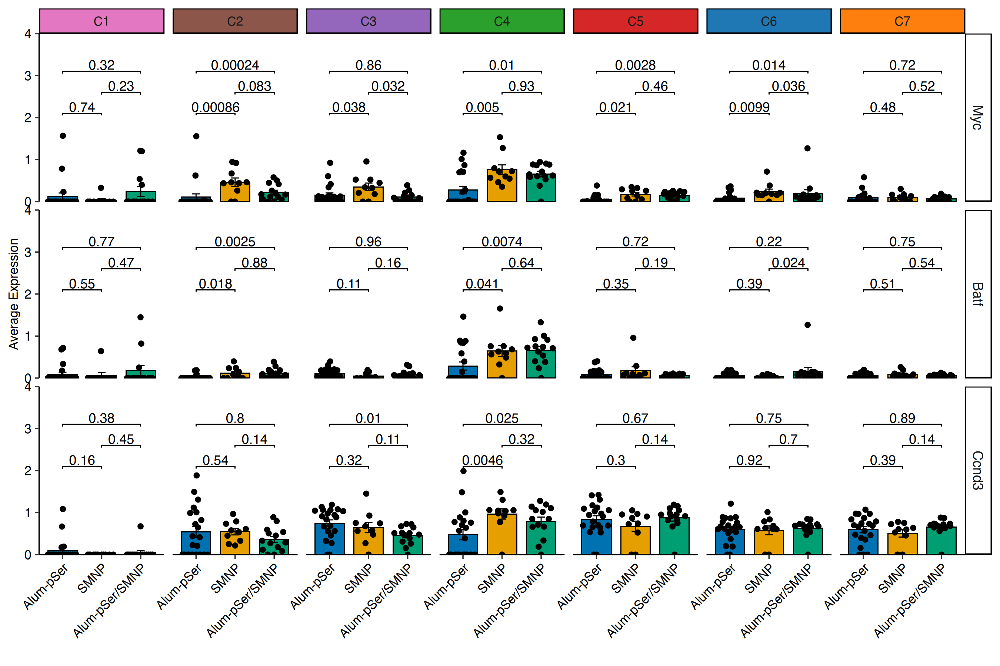

In [48]:
options(repr.plot.width=9,repr.plot.height=6,repr.plot.res=300)
# should just remove this plot
df = FetchData(srat,c('Myc','Batf','Ccnd3','phenocluster','group','mouse.id')) 

df4gg = df %>% #select(group,mouse.id,phenocluster,Ccnd3) %>%  ## Change
# change to long df format
melt(id.vars = c("group", "mouse.id", "phenocluster"), 
     value.name = 'expression',variable.name = 'gene') %>% 
# calculate mouse level mean expression 
group_by(group,mouse.id,phenocluster,gene) %>% 
mutate(expr = expm1(expression)) %>% 
summarize(ncell.expressed=sum(expr>0),mean.exp=mean(expr)) %>%
ungroup() %>% mutate(mean.exp = log1p(mean.exp)) %>%
tidyr::complete(tidyr::nesting(group,mouse.id),phenocluster,gene) %>% replace(is.na(.),0)

# add ncell.mouse info
ncell.mouse= df %>% count(group,mouse.id,name = 'ncell')
ncell.mouse = ncell.mouse %>% filter(mouse.id %in% df4gg$mouse.id)
df4gg$ncell = ncell.mouse$ncell[match(df4gg$mouse.id,ncell.mouse$mouse.id)]

df4gg = df4gg %>% filter(ncell>10) 
df4gg2 = df4gg %>% group_by(group,phenocluster,gene) %>% 
mutate(group.mean.exp = mean(mean.exp),se = sd(mean.exp) / sqrt(n()) ) %>% 
select(group,group.mean.exp,se) %>% unique() 
strip = ggh4x::strip_themed(background_y = ggh4x::elem_list_rect(fill = NA),
                            background_x = ggh4x::elem_list_rect(fill = cluster.col))
df4gg %>% 
ggplot(aes(x=group,y=mean.exp)) + theme_classic() + 
geom_bar(data = df4gg2, aes(x=group,y=group.mean.exp,fill=group),
         stat='identity',color='black',width=0.75,linewidth = 0.25) + 
geom_errorbar(data = df4gg2, width = 0.2,linewidth = 0.25,
              aes(x=group,y=group.mean.exp,ymin=group.mean.exp - se, ymax=group.mean.exp + se)) + 
geom_quasirandom(size=1,color='black') +
scale_fill_manual(values=group.col) +
#stat_compare_means(method='kruskal.test',tip.length = 0.02,size=3,label.y = 3.5) +
stat_compare_means(method='wilcox.test',tip.length = 0.02, comparisons = my.comparison,
                   size=3,label.y = c(2,2.5,3),bracket.size=0.25)+ 
ggh4x::facet_grid2(gene ~ phenocluster,strip = strip) +
labs(x='',y='Average Expression',size='Fraction\nExpressed') +
scale_y_continuous(expand =c(0,0),limits = c(0,4)) +
guides(fill = 'none') +
Axis_themes +
theme() 

In [134]:
# df %>% select(group, mouse.id, phenocluster, Myc, Batf, mTORC1) %>% 
# tidyr::pivot_longer(cols = c(Myc, Batf, mTORC1), names_to = "gene", values_to = "expression") %>% 
# filter(mouse.id == 'AG1_HTO2')

In [97]:
myc.targets = c("Abce1", "Acsl1", "Ahcy", "Aimp2", "Ak4", "Akap1", "Atp1b3", "Auh", "Bop1", "Cad", "Cdk4", "Cebpz", "Ctps1", "Ctsc", "Cycs", "Cyp51", "Dancr", "Dcun1d4", "Ddx10", "Ddx21", "Dhodh", "Ebna1bp2", "Exosc2", "Exosc7", "Fabp5", "Fasn", "Fkbp4", "Fxn", "Gcsh", "Gpd1l", "Grsf1", "Hspe1", "Iars1", "Impdh2", "Ldha", "Lrp8", "Mest", "Mgst1", "Mrpl3", "Mthfd1", "Mxi1", "Myc", "Nampt", "Nefh", "Nme1", "Nolc1", "Odc1", "Paics", "Pebp1", "Pno1", "Pold2", "Polr2h", "Ppat", "Prdx4", "Prps2", "Pum3", "Pycr1", "Rabepk", "Ranbp1", "Rcc1", "Rpia", "Rrp1b", "Rrs1", "Slc16a1", "Slc20a1", "Slc39a14", "Slc39a6", "Sord", "Srm", "Srpk1", "Tarbp1", "Tbl3", "Tfrc", "Tmem97", "Trap1", "Uchl3", "Uck2", "Vars1", "Vrk1", "Znf239")
e2f.targets = c("Bard1", "Brd2", "Bub3", "Cbx5", "Ccna2", "Cdc25a", "Cdc6", "Cdk1", "Cdk2", "Cenpa", "Cenpe", "Chek1", "Cks1bp7", "Cstf1", "Dbf4", "Dut", "E2f2", "E2f3", "Fen1", "H2ac18", "H2ac6", "H2ax", "H2az1", "H2bc21", "H3c4", "Hltf", "Hmgb1", "Hmgb3", "Mad2l1", "Mcm3", "Mcm5", "Mcm6", "Mlh1", "Msh2", "Nap1l4", "Ndc80", "Orc1", "Pcna", "Pola1", "Pola2", "Pold1", "Prim2", "Prkdc", "Pttg1", "Rad51", "Rad54l", "Rb1", "Rbl1", "Rfc2", "Rfc3", "Rfc4", "Rpa3", "Rrm1", "Smc2", "Smc4", "Supt4h1", "Tk1", "Top2a", "Tp53", "Ttk", "Umps", "Ung")
mtorc1.targets = c("Adrm1", "Ahsa1", "Aldh4a1", "Atf5", "Atp5g1", "Atp5g3", "Bmp1", "Btk", "Bysl", "C8orf41", "Calu", "Cct5", "Cct6a", "Cdk4", "Chuk", "Copb2", "Cse1l", "Eif2b4", "Eif4g2", "Emp3", "Fam89b", "Fasn", "Hccs", "Hmhb1", "Hspa4", "Hspa8", "Hspe1", "Hyou1", "Id2", "Ifi30", "Imp4", "Jtb", "Lrrc32", "Mllt11", "Mmp15", "Mrpl12", "Mrps11", "Ndufa9", "Npm3", "Pfkm", "Pgk1", "Prmt1", "Psmd5", "Psmd8", "Ptbp1", "Rabepk", "Rabggtb", "Safb", "Sf3a3", "Sit1", "Slc29a1", "Snrpc", "Sqle", "Srm", "Tceb3", "Tfrc", "Tgds", "Timm17a", "Tmed2", "Tmem109", "Ube2l3", "Wnt10b", "Znf259")

In [98]:
test = srat
test = AddModuleScore(test, features=list(myc.targets,e2f.targets,mtorc1.targets))
test@meta.data = test@meta.data %>% 
rename('Myc_Targets' = 'Cluster1','E2f_Targets' = 'Cluster2','mTORC1_Targets' = 'Cluster3',)


Warning message:
“The following features are not present in the object: Mgst1, Nme1, Znf239, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Cks1bp7, H2ac18, Supt4h1, Tp53, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Aldh4a1, Atp5g1, Atp5g3, C8orf41, Fam89b, Hmhb1, Tceb3, Znf259, not searching for symbol synonyms”


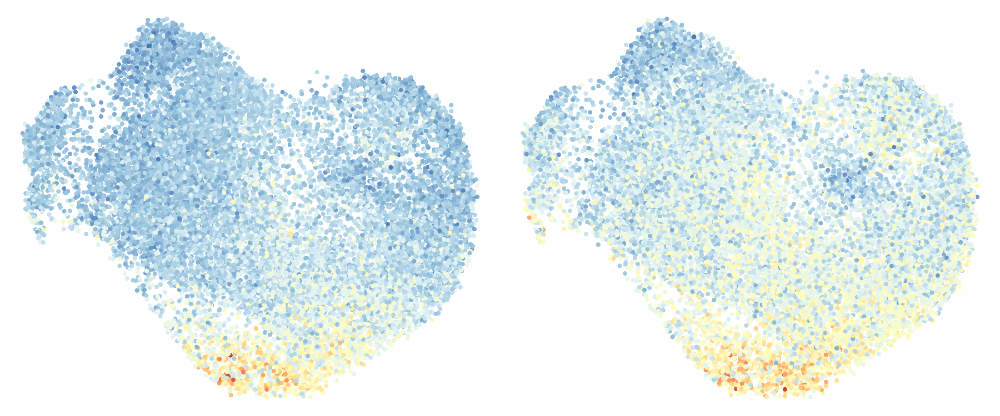

In [83]:
metadata = test@meta.data

p1 = metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=Myc_Targets))+ theme_void() + NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1)  

p2 = metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=mTORC1_Targets))+ theme_void()+ NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1)  

p3 = metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=E2f_Targets))+ theme_void()+ NoLegend()+
geom_point(size=0.3)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1)  

options(repr.plot.width=6, repr.plot.height=2.5,repr.plot.res=300)
cowplot::plot_grid(p1,p2,nrow=1)

out = 'figures/fig2/umap_myc_mtorc1_targets.pdf'
ggsave(out,device='pdf', height = 2.5, width = 6,
       dpi = 300,useDingbats = FALSE)

`summarise()` has grouped output by 'group', 'mouse.id', 'phenocluster'. You
can override using the `.groups` argument.
Adding missing grouping variables: `phenocluster`, `gene`
Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_signif()`).”
Warning message in wilcox.test.default(c(0, 0.234477053565898, 0.0875952141147456, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0.234477053565898, 0.0875952141147456, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0.188728246577752, 0.120971482959218, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0.188728246577752, 0.120971482959218, :
“cannot compute exact p-value with ties”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`position_quasirandom()`).”
Dunn (1964) Kruskal-Wallis multiple comparison

  p-values adjusted with the Benjamini-Hochberg metho

                  Comparison         Z      P.unadj        P.adj
1 Alum-pSer - Alum-pSer/SMNP -2.480155 1.313254e-02 0.0196988163
2           Alum-pSer - SMNP -4.002899 6.257093e-05 0.0001877128
3      Alum-pSer/SMNP - SMNP -1.647738 9.940647e-02 0.0994064684

Dunn (1964) Kruskal-Wallis multiple comparison

  p-values adjusted with the Benjamini-Hochberg method.




                  Comparison         Z      P.unadj        P.adj
1 Alum-pSer - Alum-pSer/SMNP -3.495361 4.734210e-04 0.0007101315
2           Alum-pSer - SMNP -4.214523 2.503067e-05 0.0000750920
3      Alum-pSer/SMNP - SMNP -0.998111 3.182255e-01 0.3182255450

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_signif()`).”
Warning message in wilcox.test.default(c(0, 0.234477053565898, 0.0875952141147456, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0.234477053565898, 0.0875952141147456, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0.188728246577752, 0.120971482959218, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0, 0.188728246577752, 0.120971482959218, :
“cannot compute exact p-value with ties”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`position_quasirandom()`).”


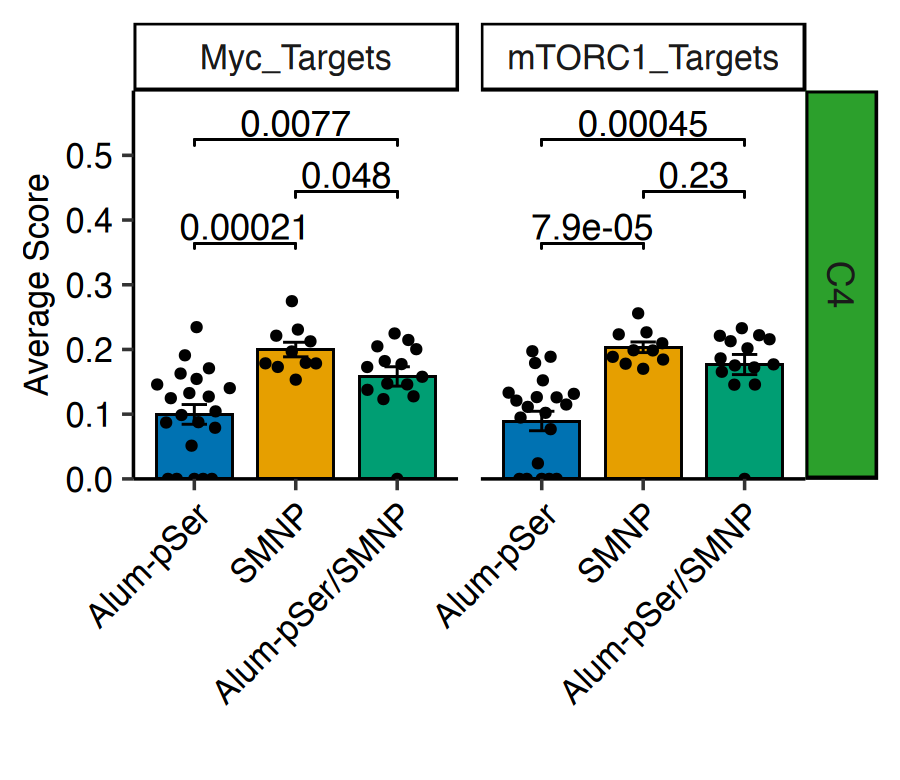

In [99]:
options(repr.plot.width=3,repr.plot.height=2.6,repr.plot.res=300) 

df = FetchData(test,c('group','mouse.id','phenocluster','Myc_Targets','mTORC1_Targets'))
df4gg = df %>% 
# change to long df format
melt(id.vars = c("group", "mouse.id", "phenocluster"), 
     value.name = 'score',variable.name = 'gene') %>% 
# calculate mouse level mean expression 
group_by(group,mouse.id,phenocluster,gene) %>% 
summarize(mean.score=mean(score)) %>% ungroup() %>% 
tidyr::complete(tidyr::nesting(group,mouse.id),phenocluster,gene) %>% replace(is.na(.),0)

# add ncell.mouse info
ncell.mouse= df %>% count(group,mouse.id,name = 'ncell')
ncell.mouse = ncell.mouse %>% filter(mouse.id %in% df4gg$mouse.id)
df4gg$ncell.mouse = ncell.mouse$ncell[match(df4gg$mouse.id,ncell.mouse$mouse.id)]

# build barplot df4gg
df4gg = df4gg %>% filter(phenocluster %in% c('C4'), ncell.mouse>10)  
df4gg2 = df4gg %>% group_by(group,phenocluster,gene) %>% 
mutate(group.mean.score = mean(mean.score), std = sd(mean.score), se = std / sqrt(n()) ) %>% 
select(group,group.mean.score,std,se) %>% unique() 

strip = ggh4x::strip_themed(background_x = ggh4x::elem_list_rect(fill = NA ),
                            background_y = ggh4x::elem_list_rect(fill = cluster.col[4]))

df4gg %>% 
ggplot(aes(x=group,y=mean.score)) + theme_classic() + 
geom_bar(data = df4gg2, aes(x=group,y=group.mean.score,fill=group),
         stat='identity',color='black',width=0.75,linewidth = 0.25) + 
geom_errorbar(data = df4gg2, width = 0.25,linewidth = .25,
              aes(x=group,y=group.mean.score,ymin=group.mean.score - se, ymax=group.mean.score + se)) +
geom_quasirandom(size=0.5,color='black') +
scale_fill_manual(values=group.col) +
#stat_compare_means(method='kruskal.test',tip.length = 0.02,size=3,label.y = 0.75) +
stat_compare_means(method='wilcox.test',tip.length = 0.03, comparisons = my.comparison,
                   label.y=c(0.35,0.43,0.51),size=3,bracket.size=0.25) +
scale_y_continuous(expand =c(0,0),limits=c(0,.6)) +
ggh4x::facet_grid2( phenocluster ~ gene ,strip = strip) +
labs(x='',y='Average Score',size='Fraction\nExpressed') +
guides(fill = 'none') +
Axis_themes

#TukeyHSD(aov(mean.score ~ Group,data=df4gg %>% filter(phenocluster%in%c('C4'))))
FSA::dunnTest(mean.score ~ group,
              data=df4gg %>% filter(phenocluster%in%c('C4'),gene=='Myc_Targets'), 
              method="bh")
FSA::dunnTest(mean.score ~ group,
              data=df4gg %>% filter(phenocluster%in%c('C4'),gene=='mTORC1_Targets'), 
              method="bh")

out = 'figures/fig2/TF_targets_by_mouse_C4.pdf'
ggsave(out,device='pdf', height = 2.6, width = 3,
       dpi = 300,useDingbats = FALSE)


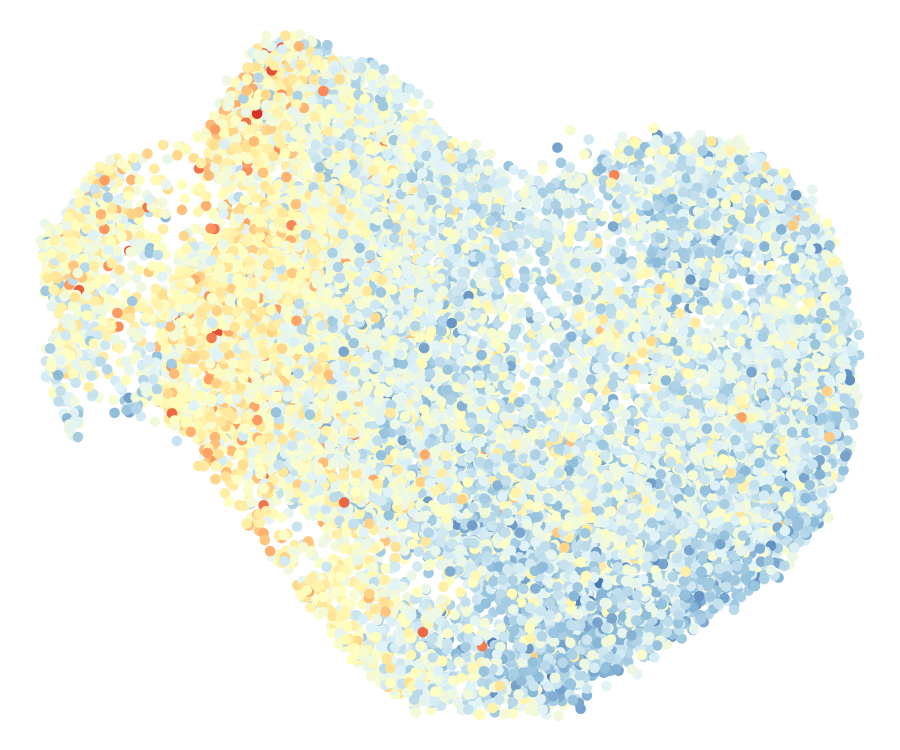

In [237]:
# Holmes JEM
options(repr.plot.width=3, repr.plot.height=2.5,repr.plot.res=300)

features = list(c('Cd86','Cd80','Cd83','Bcl2a1d','Bcl2a1b','Bcl2a1a','Bcl2a1c','Mir155hg','Cd40','Lmo2',
                 'Nfkbia','Btk','Lyn','Cd22','Cd72','Blnk','Blk','Ptpn6','Sla'))
test = AddModuleScore(srat,features, assay='RNA',name = 'LZ')

metadata = test@meta.data
metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=LZ1))+ theme_void()+ NoLegend()+
geom_point(size=0.3)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) 

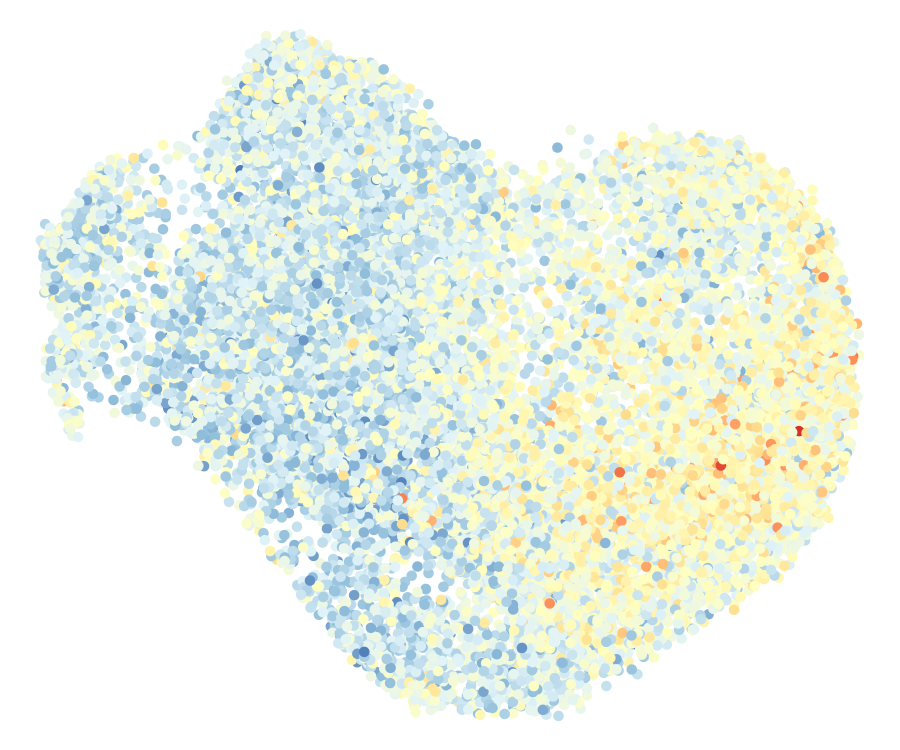

In [238]:
# Holmes JEM
options(repr.plot.width=3, repr.plot.height=2.5,repr.plot.res=300)
features = list(c('Cxcr4','Aicda','Foxp1','Pcna','Mki67','Cdk1','Cdc20','Cd27','Mme',
                 'Ung','E2f1','Ezh2','Ltb','Birc3','Gins2','Foxo1',
                 'Stmn1','Pclaf','Prkcb','Myc','Camk1','Lmo2','Cd180','Marcksl1','Fcrla'))
test = AddModuleScore(srat,features, assay='RNA',name = 'DZ')

metadata = test@meta.data
metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=DZ1))+ theme_void()+ NoLegend()+
geom_point(size=0.3)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) 

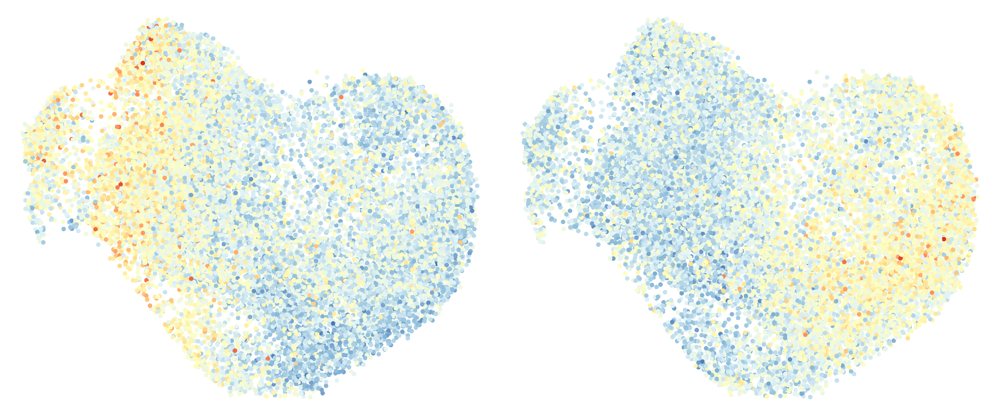

In [85]:
features = list(c('Cd86','Cd80','Cd83','Bcl2a1d','Bcl2a1b','Bcl2a1a','Bcl2a1c','Mir155hg','Cd40','Lmo2',
                 'Nfkbia','Btk','Lyn','Cd22','Cd72','Blnk','Blk','Ptpn6','Sla'))
test = AddModuleScore(srat,features, assay='RNA',name = 'LZ')
metadata = test@meta.data
p1 = metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=LZ1))+ theme_void()+ NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) 

features = list(c('Cxcr4','Aicda','Foxp1','Pcna','Mki67','Cdk1','Cdc20','Cd27','Mme',
                 'Ung','E2f1','Ezh2','Ltb','Birc3','Gins2','Foxo1',
                 'Stmn1','Pclaf','Prkcb','Myc','Camk1','Lmo2','Cd180','Marcksl1','Fcrla'))
test = AddModuleScore(srat,features, assay='RNA',name = 'DZ')
metadata = test@meta.data
p2 = metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=DZ1))+ theme_void()+ NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) 

options(repr.plot.width=6, repr.plot.height=2.5,repr.plot.res=300)
cowplot::plot_grid(p1,p2,nrow=1)

out = 'figures/fig2/umap_Holmes_JEM.pdf'
ggsave(out,device='pdf', height = 2.5, width = 6,
       dpi = 300,useDingbats = FALSE)

In [86]:
mathews.etal2=read.csv('published_dataset/mathews_bcell_types_germsub_zonesub.csv')
mathews.etal2$id = seq(1,nrow(mathews.etal2))
mathews.etal2 = melt(mathews.etal2,value.name = 'gene', id = 'id') %>% filter(gene!='')
table(mathews.etal2$variable)


   NaiveBcell  MarginalZone   PlasmaCells   GC_DarkZone  GC_LightZone 
            1             1            13            61            41 
   GC_LZ_help GC_DZ_reentry   MemoryCells   PreMemCells 
           10             7            27             8 

In [87]:
test = srat

for (group in unique(mathews.etal2$variable)){
    print(group)
    features = list(mathews.etal2[mathews.etal2$variable == group,'gene'])
    test = AddModuleScore(test, features, assay='RNA',name = group) 
}

[1] "NaiveBcell"
[1] "MarginalZone"
[1] "PlasmaCells"
[1] "GC_DarkZone"


Warning message:
“The following features are not present in the object: Sepp1, Pde2a, not searching for symbol synonyms”


[1] "GC_LightZone"
[1] "GC_LZ_help"
[1] "GC_DZ_reentry"
[1] "MemoryCells"


Warning message:
“The following features are not present in the object: Ackr3, not searching for symbol synonyms”


[1] "PreMemCells"


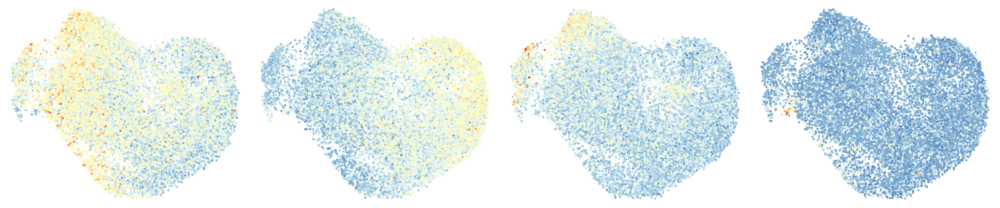

In [92]:
metadata = test@meta.data

metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=GC_LZ_help1))+ theme_void()+ NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) -> p1

metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=GC_DZ_reentry1))+ theme_void()+ NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) -> p2

metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=MemoryCells1))+ theme_void()+ NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) -> p3

metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=PlasmaCells1))+ theme_void()+ NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) -> p4

options(repr.plot.width=12, repr.plot.height=2.5,repr.plot.res=300)
cowplot::plot_grid(p1,p2,p3,p4,nrow=1)
out = 'figures/fig2/umap_Mathews.pdf'
ggsave(out,device='pdf', height = 2.5, width = 12,
       dpi = 300,useDingbats = FALSE)

In [93]:
king.b.markers = readRDS('published_dataset/king.b.markers.RDS')
king.b.markers %>% 
mutate(gene = str_to_title(king.b.markers$gene)) %>%
filter(!grepl(c('Rps'),gene),!grepl('Rpl',gene),!grepl('Gm',gene),
       !grepl('Rik',gene),!grepl('mt-',gene),!grepl('mmu-mir',gene)) %>% 
filter(p_val_adj<1e-5, avg_log2FC>0.1) -> top

In [94]:
test = srat

for (group in unique(king.b.markers$cluster)){
    print(group)
    features = list(top[top$cluster == group,'gene'])
    test = suppressWarnings(AddModuleScore(test,features, assay='RNA',name = group)) 
}

[1] "Naive"
[1] "Activated"
[1] "preGC"
[1] "LZ GC"
[1] "GC"
[1] "DZ GC"
[1] "FCRL2/3high GC"
[1] "prePB"
[1] "Plasmablast"
[1] "MBC"
[1] "MBC FCRL4+"
[1] "Cycling"


In [11]:
## Look at all the clusters
# options(repr.plot.height=2, repr.plot.width=3)
# for (group in unique(king.b.markers$cluster)) {
#     group = paste0(group,'1')
#     print(group)
#     print(FeaturePlot(test,features = group))
# }

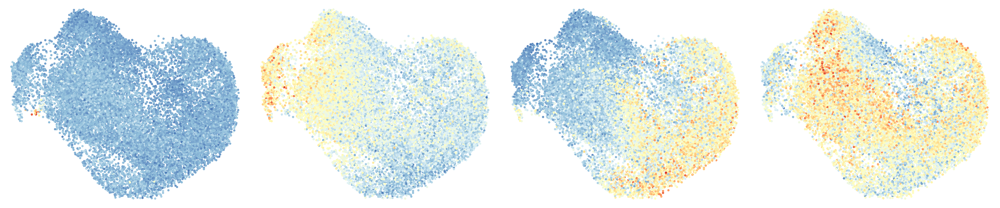

In [95]:
options(repr.plot.width=3, repr.plot.height=2.5,repr.plot.res=300)

metadata = test@meta.data
metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=Plasmablast1))+ theme_void()+ NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) -> p1

metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=MBC1))+ theme_void()+ NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) -> p2 

metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=Cycling1))+ theme_void()+ NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) -> p3

metadata %>% 
ggplot(aes(x=UMAP1,y=UMAP2,color=GC1))+ theme_void()+ NoLegend()+
geom_point_rast(size=0.1,raster.dpi = 1000)+ 
scale_colour_distiller(palette='RdYlBu',direction=-1) -> p4

options(repr.plot.width=12, repr.plot.height=2.5,repr.plot.res=300)
cowplot::plot_grid(p1,p2,p3,p4,nrow=1)
out = 'figures/fig2/umap_King.pdf'
ggsave(out,device='pdf', height = 2.5, width = 12,
       dpi = 300,useDingbats = FALSE)